💡 Mi propuesta es dividirlo en etapas:

✅ Paso 1: Extraer la red vial de Bogotá desde OpenStreetMap usando osmnx.

✅ Paso 2: Asignar velocidades a cada segmento con un modelo de Poisson no homogéneo.

✅ Paso 3: Implementar el cálculo de rutas óptimas según el tráfico modelado.

## 1. Extraer la red vial

📡 Descargando la red vial de Suba, Bogotá...
🗺️ Mostrando la red vial de Suba en un mapa estático...


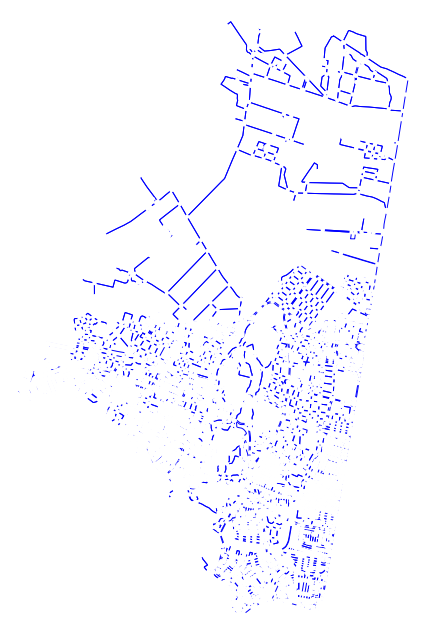

🌍 Mostrando la red vial de Suba en un mapa interactivo...


In [1]:
import osmnx as ox
import networkx as nx
import folium
import matplotlib.pyplot as plt

print("📡 Descargando la red vial de Suba, Bogotá...")
G = ox.graph_from_place("Suba, Bogotá, Colombia", network_type="drive")

G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)

print("🗺️ Mostrando la red vial de Suba en un mapa estático...")
fig, ax = ox.plot_graph(G, node_size=10, edge_linewidth=0.7, edge_color="blue", bgcolor="white")

print("🌍 Mostrando la red vial de Suba en un mapa interactivo...")
centro_suba = [4.75, -74.1]
mapa = folium.Map(location=centro_suba, zoom_start=13, tiles="cartodbpositron")

for u, v, data in G.edges(data=True):
    if "geometry" in data:
        coords = [(lat, lon) for lon, lat in data["geometry"].coords]
        folium.PolyLine(coords, color="blue", weight=1, opacity=0.7).add_to(mapa)
    else:
        orig = (G.nodes[u]["y"], G.nodes[u]["x"])
        dest = (G.nodes[v]["y"], G.nodes[v]["x"])
        folium.PolyLine([orig, dest], color="blue", weight=1, opacity=0.7).add_to(mapa)

for node, data in G.nodes(data=True):
    folium.CircleMarker(
        location=(data["y"], data["x"]),
        radius=2,
        color="yellow",
        fill=True,
        fill_color="yellow",
        fill_opacity=0.8
    ).add_to(mapa)

mapa


## 2 Parte simular la velocidad como un poisson no homegeneo 

### **📌 Explicación Teórica: Asignación de Velocidades con un Proceso de Poisson No Homogéneo**  

El objetivo de este paso es **asignar velocidades realistas** a cada calle de Bogotá, teniendo en cuenta la variabilidad del tráfico a lo largo del día. Para esto, utilizamos un **proceso de Poisson no homogéneo**.  

---

## **1️⃣ ¿Qué es un Proceso de Poisson No Homogéneo? 📊**  
Un **proceso de Poisson no homogéneo (NHPP)** es un **modelo estocástico de eventos** donde la tasa de ocurrencia ($ \lambda(t) $) **cambia con el tiempo**.  

En este caso, **modelamos la congestión vehicular** como un proceso de Poisson no homogéneo, donde:  
- **Los "eventos" son llegadas de congestión en una calle.**  
- **La tasa $ \lambda(t) $ cambia con la hora del día, reflejando patrones reales de tráfico.**  

Matemáticamente, el número de eventos en un intervalo de tiempo $ t $ sigue una distribución de Poisson:  
$$
N(t) \sim \text{Poisson}(\lambda(t))
$$
donde $ \lambda(t) $ es la **tasa de congestión en cada hora del día**.

### **Ejemplo Intuitivo 🚦**
- En **hora pico** ($ t = 8 AM $), $ \lambda(8) = 50 $ significa que hay **más eventos de congestión** en esa hora.  
- En la **madrugada** ($ t = 3 AM $), $ \lambda(3) = 3 $, por lo que hay **menos eventos de congestión**.  
- Al generar valores de Poisson para cada hora, obtenemos una **cantidad de eventos aleatoria** que hace variar la velocidad en cada calle.  

---

## **2️⃣ Cómo Aplicamos Poisson No Homogéneo en la Velocidad 🚗**  
1️⃣ **Definimos $ \lambda(t) $, la tasa de congestión por hora**:  
   - **Hora pico (6-9 AM y 4-7 PM):** $ \lambda(t) $ es alto (mucho tráfico).  
   - **Noche (11 PM - 4 AM):** $ \lambda(t) $ es bajo (poco tráfico).  

2️⃣ **Cada calle comienza con una velocidad base**, según su tipo:  
   - **Autopistas** → 60 km/h  
   - **Avenidas** → 50 km/h  
   - **Calles secundarias** → 40 km/h  

3️⃣ **Para cada hora, generamos un número aleatorio de congestiones usando** $ N(t) \sim \text{Poisson}(\lambda(t)) $.  

4️⃣ **Cada evento de congestión reduce la velocidad de la calle en un 3%** hasta un mínimo de 5 km/h.  

### **Ejemplo de Aplicación 🚦**
Supongamos que estamos en la **Avenida Caracas a las 8 AM**:  
- Su velocidad base es **50 km/h**.  
- Generamos un número de congestiones con Poisson($ \lambda(8) = 50 $).  
- Si $ N(8) = 10 $ congestiones, la velocidad final se reduce un **30%**:  
  $$
  V_{\text{final}} = 50 \times (1 - 0.3) = 35 \text{ km/h}
  $$

Esto hace que las velocidades **varíen dinámicamente en función del tiempo y la ubicación**.

---

## **3️⃣ Ventajas del Enfoque**
✅ **Modela la congestión de forma realista** en función del tiempo.  
✅ **Cada calle puede tener una velocidad distinta** cada hora.  
✅ **Incorpora la incertidumbre y variabilidad natural del tráfico.**  
✅ **Permite generar gráficos y hacer análisis de patrones de velocidad.**  

---

## **4️⃣ Conexión con los Gráficos 📈**
📈 **Gráfico de líneas**:  
   - Muestra cómo cambia la velocidad en diferentes calles durante el día.  
📊 **Histograma**:  
   - Muestra la distribución de velocidades en toda la red vial.  

---

## **📌 Conclusión**
Utilizar un **proceso de Poisson no homogéneo** nos permite **simular la variabilidad del tráfico de manera realista**, generando velocidades dinámicas que dependen tanto del **tiempo** como del **espacio**.  

💡 **¿Quieres algún ajuste en la fórmula o seguimos con la parte de rutas óptimas?** 🚀

🚗 Calculando velocidades ajustadas para cada calle...


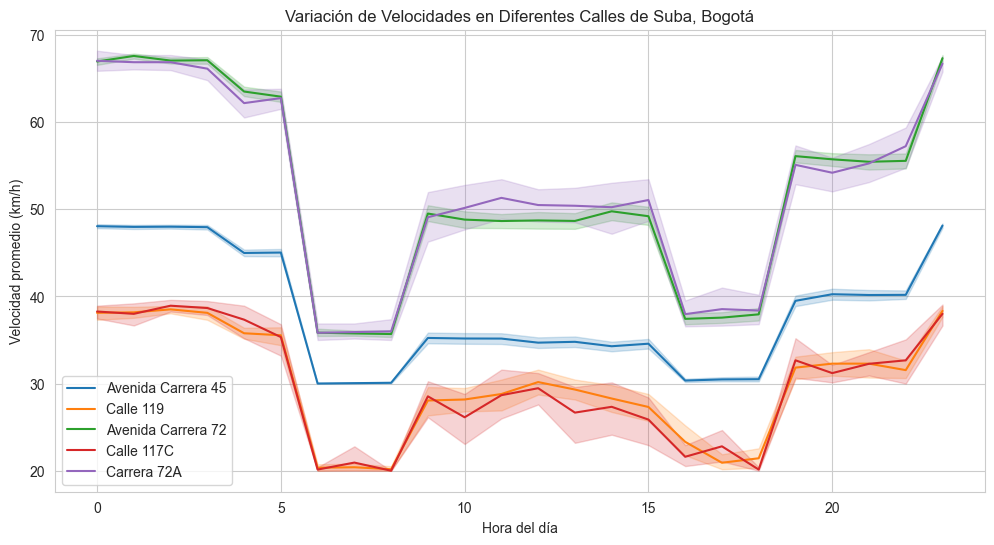

In [2]:
import numpy as np
import pandas as pd
import osmnx as ox
import matplotlib.pyplot as plt
import seaborn as sns


# 🔥 2. Función lambda(t) para modelar la congestión en diferentes horas del día
def lambda_t(t):
    if 4 <= t < 6:
        return 5
    elif 6 <= t < 9:
        return 30  
    elif 9 <= t < 16:
        return 15  
    elif 16 <= t < 19:
        return 25  
    elif 19 <= t < 23:
        return 10  
    else:
        return 2  

def velocidad_base(nombre_calle):
    if isinstance(nombre_calle, str):
        if "Autopista" in nombre_calle or "Carrera 7" in nombre_calle:
            return 70  
        elif "Avenida" in nombre_calle or "Carrera" in nombre_calle:
            return 50  
    return 40  

print("🚗 Calculando velocidades ajustadas para cada calle...")
velocidades = []

for u, v, data in G.edges(data=True):
    nombre_calle = data.get("name", "Calle Desconocida")  
    if isinstance(nombre_calle, list):  
        nombre_calle = nombre_calle[0]  

    distancia_km = data.get("length", 100) / 1000  
    velocidad_inicial = velocidad_base(nombre_calle)  

    for t in range(24):  
        num_eventos = np.random.poisson(lambda_t(t))

        reduccion_max = velocidad_inicial * 0.5  
        reduccion_real = min(num_eventos * 0.02 * velocidad_inicial, reduccion_max)  

        velocidad_final = velocidad_inicial - reduccion_real  
        velocidad_final = max(velocidad_final, 15 if velocidad_inicial < 50 else 30)  

        tiempo_viaje = max((distancia_km / velocidad_final) * 60, 0.5)  

        velocidades.append({
            "Hora": t,
            "Origen": u,
            "Destino": v,
            "Nombre Calle": nombre_calle,
            "Distancia (km)": distancia_km,
            "Velocidad (km/h)": velocidad_final,
            "Tiempo (min)": tiempo_viaje
        })

df_velocidades = pd.DataFrame(velocidades)

df_velocidades["Nombre Calle"] = df_velocidades["Nombre Calle"].apply(
    lambda x: x[0] if isinstance(x, list) else str(x)
)

df_velocidades["Nombre Calle"] = df_velocidades["Nombre Calle"].fillna("Calle Desconocida")

plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

calles_ejemplo = df_velocidades["Nombre Calle"].unique()[:5]
for calle in calles_ejemplo:
    df_calle = df_velocidades[df_velocidades["Nombre Calle"] == calle]
    sns.lineplot(data=df_calle, x="Hora", y="Velocidad (km/h)", label=calle)

plt.xlabel("Hora del día")
plt.ylabel("Velocidad promedio (km/h)")
plt.title("Variación de Velocidades en Diferentes Calles de Suba, Bogotá")
plt.legend()
plt.show()



# 3. Encontrar ruta optima

In [ ]:
class RouteOptimizer:
    def __init__(self, G, df_velocidades):
        self.G = G
        self.df_velocidades = df_velocidades
        self.df_rutas = None
        self._preprocess_data()
    
    def _preprocess_data(self):
        self.tiempos_viaje = {}
        for _, row in self.df_velocidades.iterrows():
            key = (row["Origen"], row["Destino"], row["Hora"])
            self.tiempos_viaje[key] = row["Distancia (km)"] / row["Velocidad (km/h)"] * 60

        for u, v, k, data in self.G.edges(keys=True, data=True):
            for hora in range(24):
                key = (u, v, hora)
                data[f"peso_{hora}"] = self.tiempos_viaje.get(key, 2)

    def save_routes_to_excel(self, filename="mejores_rutas.xlsx"):
        """Guarda todas las rutas encontradas en un archivo Excel"""
        if self.df_rutas is None or self.df_rutas.empty:
            print("No hay datos para guardar")
            return False
        
        try:
            df_export = self.df_rutas.copy()
            
            df_export['nodos'] = df_export['nodos'].apply(lambda x: ' → '.join(map(str, x)))
            
            column_order = [
                'ruta_id', 'tiempo_minutos', 'distancia_km', 'velocidad_promedio',
                'num_intersecciones', 'calles', 'nodos'
            ]
            df_export = df_export[column_order]
            
            # Guardar en Excel
            df_export.to_excel(filename, index=False, engine='openpyxl')
            print(f"✅ Rutas guardadas exitosamente en {filename}")
            return True
            
        except Exception as e:
            print(f"❌ Error al guardar el archivo: {str(e)}")
            return False

    def find_optimal_routes(self, origen, destino, hora, num_rutas=50):
        self.origen = self._geocode(origen)
        self.destino = self._geocode(destino)
        self.hora = hora
        
        self.nodo_origen = ox.distance.nearest_nodes(self.G, X=self.origen[1], Y=self.origen[0])
        self.nodo_destino = ox.distance.nearest_nodes(self.G, X=self.destino[1], Y=self.destino[0])
        
        self.df_rutas = self._generate_routes(num_rutas)
        return self.df_rutas
    
    def _geocode(self, location):
        if isinstance(location, str):
            try:
                return ox.geocode(location)
            except:
                print(f"No se pudo geocodificar: {location}")
                return (4.75, -74.1)  
        return location
    
    def _generate_routes(self, num_rutas):
        routes = []
        G_temp = self.G.copy()
        peso_hora = f"peso_{self.hora}"
        
        for i in range(num_rutas):
            try:
                path = nx.shortest_path(G_temp, self.nodo_origen, self.nodo_destino, weight=peso_hora)
                route_data = self._calculate_route_stats(path, peso_hora)
                
                if not any(np.array_equal(route_data['nodos'], r['nodos']) for r in routes):
                    routes.append(route_data)
                
                self._modify_edge_weights(G_temp, path, peso_hora, factor=2 + i*0.1)
                
            except (nx.NetworkXNoPath, KeyError):
                continue
        
        return self._create_dataframe(routes)
    
    def _modify_edge_weights(self, graph, path, weight_attribute, factor=2):
        for u, v in zip(path[:-1], path[1:]):
            if graph.has_edge(u, v):
                for k in graph[u][v]:
                    graph[u][v][k][weight_attribute] *= factor
    
    def _calculate_route_stats(self, path, weight_attribute):
        tiempo_total = 0
        distancia_total = 0
        calles = []
        seen_edges = set()
        
        for u, v in zip(path[:-1], path[1:]):
            edge_data = self.G.get_edge_data(u, v)[0]
            tiempo_total += edge_data[weight_attribute]
            distancia_total += edge_data["length"] / 1000
            
            nombre_calle = edge_data.get("name", "Calle Desconocida")
            if isinstance(nombre_calle, list):
                nombre_calle = nombre_calle[0]
            
            if (u, v) not in seen_edges:
                calles.append(nombre_calle)
                seen_edges.add((u, v))
        
        return {
            "nodos": path,
            "tiempo_minutos": round(tiempo_total, 2),
            "distancia_km": round(distancia_total, 2),
            "calles": calles,
            "num_intersecciones": len(path) - 1,
            "velocidad_promedio": round(distancia_total / (tiempo_total / 60), 2)
        }
    
    def _create_dataframe(self, routes):
        if not routes:
            return pd.DataFrame()
        
        df = pd.DataFrame(routes)
        df = df.sort_values("tiempo_minutos").drop_duplicates(subset="nodos")
        df = df.reset_index(drop=True)
        df["ruta_id"] = df.index
        return df
    
    def plot_best_route(self):
        if self.df_rutas is None or self.df_rutas.empty:
            print("No hay rutas para mostrar")
            return None
        
        best_route = self.df_rutas.iloc[0]
        return self._plot_single_route(best_route, "Mejor Ruta", "blue")
    
    def _plot_single_route(self, route, title, color):
        m = folium.Map(location=self._get_center(), zoom_start=13, tiles="cartodbpositron")
        self._add_route_to_map(m, route, color)
        self._add_markers(m)
        self._add_stats_box(m, route, title)
        return m
    
    def _add_route_to_map(self, map_object, route, color):
        for u, v in zip(route['nodos'][:-1], route['nodos'][1:]):
            edge_data = self.G.get_edge_data(u, v)[0]
            
            if "geometry" in edge_data:
                coords = [(point[1], point[0]) for point in edge_data["geometry"].coords]
            else:
                coords = [
                    (self.G.nodes[u]["y"], self.G.nodes[u]["x"]),
                    (self.G.nodes[v]["y"], self.G.nodes[v]["x"])
                ]
            
            folium.PolyLine(
                coords,
                color=color,
                weight=4,
                opacity=0.8,
                tooltip=f"{route['tiempo_minutos']} min | {route['distancia_km']} km"
            ).add_to(map_object)
    
    def _get_center(self):
        return [
            (self.origen[0] + self.destino[0])/2,
            (self.origen[1] + self.destino[1])/2
        ]
    
    def _add_markers(self, map_object):
        folium.Marker(
            location=self.origen,
            popup="Origen",
            icon=folium.Icon(color="green", icon="play")
        ).add_to(map_object)
        
        folium.Marker(
            location=self.destino,
            popup="Destino",
            icon=folium.Icon(color="red", icon="flag")
        ).add_to(map_object)
    
    def _add_stats_box(self, map_object, route, title):
        stats_html = f"""
        <div style="position: fixed; 
                    bottom: 50px; 
                    left: 50px; 
                    width: 250px; 
                    height: auto; 
                    background: white;
                    border: 2px solid black;
                    padding: 10px;
                    z-index: 1000;
                    font-family: Arial;
                    font-size: 14px;">
            <h4 style="margin:0 0 10px 0;">{title}</h4>
            <p style="margin: 5px 0;">⏱️ Tiempo: {route['tiempo_minutos']} min</p>
            <p style="margin: 5px 0;">📏 Distancia: {route['distancia_km']} km</p>
            <p style="margin: 5px 0;">🚗 Velocidad: {route['velocidad_promedio']} km/h</p>
            <p style="margin: 5px 0;">🚦 Intersecciones: {route['num_intersecciones']}</p>
        </div>
        """
        map_object.get_root().html.add_child(folium.Element(stats_html))
    
    def compare_routes(self, index1, index2):
        if self.df_rutas is None or len(self.df_rutas) < 2:
            print("No hay suficientes rutas para comparar")
            return None
        
        try:
            route1 = self.df_rutas.iloc[index1]
            route2 = self.df_rutas.iloc[index2]
        except IndexError:
            print("Índices fuera de rango")
            return None
        
        m = folium.Map(location=self._get_center(), zoom_start=13, tiles="cartodbpositron")
        
        self._add_route_to_map(m, route1, "blue")
        self._add_route_to_map(m, route2, "red")
        
        self._add_markers(m)
        
        comparison_html = f"""
        <div style="position: fixed; 
                    bottom: 50px; 
                    right: 50px; 
                    width: 300px; 
                    height: auto; 
                    background: white;
                    border: 2px solid black;
                    padding: 10px;
                    z-index: 1000;
                    font-family: Arial;
                    font-size: 14px;">
            <h4 style="margin:0 0 10px 0;">Comparación de Rutas</h4>
            <div style="display: flex; justify-content: space-between;">
                <div style="color: blue; width: 45%;">
                    <p style="margin: 5px 0;">Ruta {index1}</p>
                    <p style="margin: 5px 0;">⏱️ {route1['tiempo_minutos']} min</p>
                    <p style="margin: 5px 0;">📏 {route1['distancia_km']} km</p>
                </div>
                <div style="color: red; width: 45%;">
                    <p style="margin: 5px 0;">Ruta {index2}</p>
                    <p style="margin: 5px 0;">⏱️ {route2['tiempo_minutos']} min</p>
                    <p style="margin: 5px 0;">📏 {route2['distancia_km']} km</p>
                </div>
            </div>
            <p style="margin: 10px 0 0 0;">🔵 Ruta más rápida: {index1 if route1['tiempo_minutos'] < route2['tiempo_minutos'] else index2}</p>
        </div>
        """
        m.get_root().html.add_child(folium.Element(comparison_html))
        
        return m






In [ ]:

origen_usuario = "Centro Comercial Plaza Imperial, Suba, Bogotá"
destino_usuario = "Centro Comercial Niza, Suba, Bogotá"
hora_viaje = 8  # 8 AM

route_optimizer = RouteOptimizer(G, df_velocidades)

print(f"🛣️ Calculando múltiples rutas de {origen_usuario} a {destino_usuario} a las {hora_viaje}:00...")
df_rutas = route_optimizer.find_optimal_routes(origen_usuario, destino_usuario, hora_viaje)

route_optimizer.save_routes_to_excel()
    
print("\n📊 Rutas guardadas en Excel:")
display(df_rutas[['ruta_id', 'tiempo_minutos', 'distancia_km', 'velocidad_promedio']].head())

best_route_map = route_optimizer.plot_best_route()
display(best_route_map)

🛣️ Calculando múltiples rutas de Centro Comercial Plaza Imperial, Suba, Bogotá a Centro Comercial Niza, Suba, Bogotá a las 8:00...
✅ Rutas guardadas exitosamente en mejores_rutas.xlsx

📊 Rutas guardadas en Excel:


,ruta_id,tiempo_minutos,distancia_km,velocidad_promedio
0,0,13.74,5.81,25.35
1,1,17.04,7.71,27.14
2,2,18.34,7.87,25.76
3,3,18.34,7.63,24.95
4,4,18.61,8.22,26.50


In [41]:
df_rutas

,nodos,tiempo_minutos,distancia_km,calles,num_intersecciones,velocidad_promedio,ruta_id
0,"[1833722136, 896307122, 4913349660, 5378334896...",13.74,5.81,"[Calle 150A, Calle 150A, Carrera 103B, Calle 1...",33,25.35,0
1,"[1833722136, 373221573, 1355704035, 8400217436...",17.04,7.71,"[Avenida Carrera 104, Avenida Carrera 104, Ave...",70,27.14,1
2,"[1833722136, 373221573, 1340736396, 373221572,...",18.34,7.87,"[Avenida Carrera 104, Calle 151, Calle 151, Ca...",84,25.76,2
3,"[1833722136, 896307122, 1340736373, 896307221,...",18.34,7.63,"[Calle 150A, Carrera 103C Bis, Carrera 103C Bi...",72,24.95,3
4,"[1833722136, 896307122, 1340736373, 896307221,...",18.61,8.22,"[Calle 150A, Carrera 103C Bis, Carrera 103C Bi...",60,26.50,4
5,"[1833722136, 896307122, 4913349660, 5379505624...",20.38,8.19,"[Calle 150A, Calle 150A, Calle 148, Calle 148,...",104,24.11,5
6,"[1833722136, 896307122, 4913349660, 5379505624...",21.12,8.31,"[Calle 150A, Calle 150A, Calle 148, Calle 148,...",78,23.61,6
7,"[1833722136, 373221573, 1355704035, 8400217436...",21.46,10.06,"[Avenida Carrera 104, Avenida Carrera 104, Ave...",85,28.13,7
8,"[1833722136, 896307122, 1340736373, 896307221,...",21.48,10.48,"[Calle 150A, Carrera 103C Bis, Carrera 103C Bi...",97,29.28,8
9,"[1833722136, 373221573, 1355704035, 8400217436...",21.52,10.95,"[Avenida Carrera 104, Avenida Carrera 104, Ave...",94,30.52,9


In [42]:
comparison_map = route_optimizer.compare_routes(0,10)  # Comparar la mejor ruta con la segunda
display(comparison_map)